In [10]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import logging

logging.getLogger("matplotlib.font_manager").disabled = True

plt.rcParams["font.family"] = "Malgun Gothic"
plt.rcParams["axes.unicode_minus"] = False

# data from "Faulty Steel Plates"(Kaggle)
df = pd.read_csv("./data/winequality-white.csv")

In [11]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


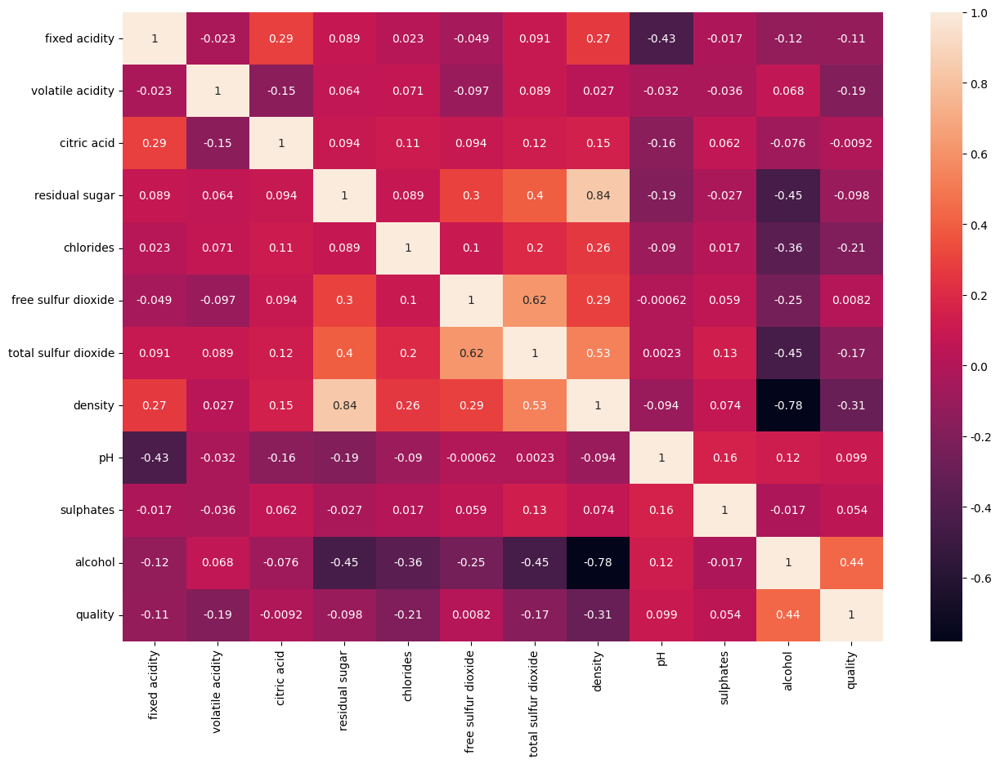

In [13]:
# 상관계수를 확인합니다. Density열에서 특정 열과의 상관 관계가 확인됩니다.
# 하지만, 변수에 대한 설명이 없기에, 알 수 없습니다...
plt.figure(figsize=(15, 10))
sns.heatmap(df.iloc[:, :].corr(), annot=True)
plt.show()

In [2]:
def remove_outliers(df, factor=1.5):
    df_filtered = df.copy()  # 원본 데이터 보호를 위한 복사본 생성
    for col in df_filtered.select_dtypes(
        include="float"
    ).columns:  # 숫자형 컬럼에 대해서만 적용
        Q1 = df_filtered[col].quantile(0.25)  # 1사분위수
        Q3 = df_filtered[col].quantile(0.75)  # 3사분위수
        IQR = Q3 - Q1  # IQR 계산
        lower_bound = Q1 - factor * IQR  # 하한 기준 (1.5 * IQR)
        upper_bound = Q3 + factor * IQR  # 상한 기준 (1.5 * IQR)
        # 하한과 상한을 벗어난 값들을 제거
        df_filtered = df_filtered[
            (df_filtered[col] >= lower_bound) & (df_filtered[col] <= upper_bound)
        ]
    return df_filtered


# 이상치 제거 후 데이터프레임
df_clean = remove_outliers(df.iloc[:, :-1])

In [3]:
df_cleaned = pd.concat([df_clean, df.iloc[:, -1]], axis=1, join="inner").reset_index(
    drop=True
)

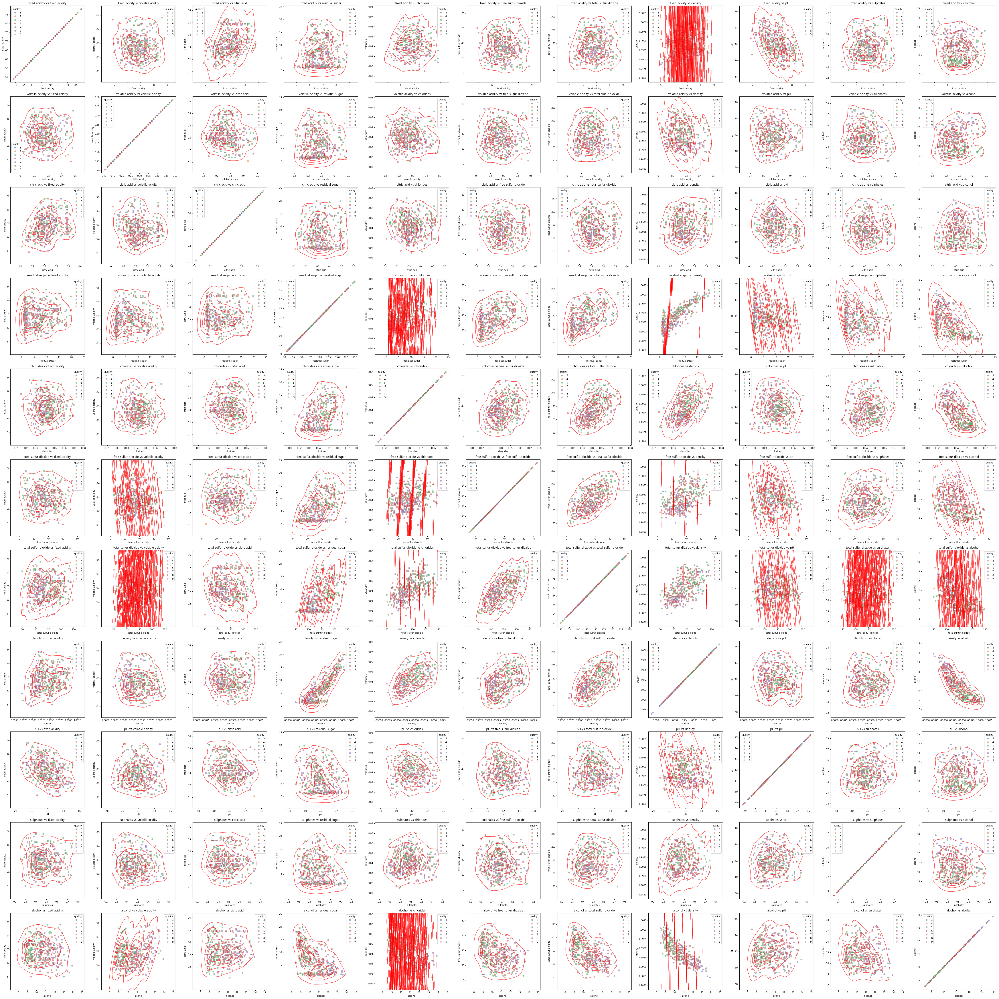

In [ ]:
# Density 변수가 시뮬레이션 하기에 적합하지 않습니다.
# 즉, Density 변수와, Density에 영향을 많이 주는 residual sugar와 alcohol을 시뮬레이션에서 제외해야합니다.
# free sulfur dioxide와 total sulfur dioxide는 전자가 커지면, 후자가 커지는 구조이기에 후자에서 전자를 뺀 변수로 대체하면 되겠습니다.
tmp = df_cleaned.sample(frac=0.1)
x_vars = tmp.columns[:-1]
y_vars = tmp.columns[:-1]
n_rows = len(x_vars)
n_cols = len(y_vars)

# Set up the matplotlib figure and axes
fig, axes = plt.subplots(
    n_rows, n_cols, figsize=(5 * n_cols, 5 * n_rows), squeeze=False
)

# Loop through each subplot (grid defined by x_vars vs y_vars)
for i, x in enumerate(x_vars):
    for j, y in enumerate(y_vars):
        ax = axes[i, j]
        # Scatter plot with hue by "quality"
        sns.scatterplot(
            data=tmp,
            x=x,
            y=y,
            hue="quality",
            ax=ax,
            palette="deep",
            alpha=0.6,
            edgecolor="w",
            s=50,
        )
        # Overlay KDE plot to display density contours
        # Adjust levels and linewidths as needed.
        sns.kdeplot(
            data=tmp,
            x=x,
            y=y,
            ax=ax,
            color="red",
            levels=5,
            linewidths=1.5,
            alpha=0.7,
            warn_singular=False,
        )

        ax.set_title(f"{x} vs {y}")

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

In [5]:
df_cleaned["sulfur dioxide diff"] = (
    df_cleaned["total sulfur dioxide"] - df_cleaned["free sulfur dioxide"]
)

In [ ]:
pd.concat([df_cleaned.iloc[:, -1], df_cleaned.iloc[:, :-1]], axis=1).drop(
    columns=["total sulfur dioxide"]
).to_csv("./data/cleaned.csv", index=False)